In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation
from pyspark.sql.functions import *

These data probably come from a sql database, these are the datasets that they provide us and how the rely each other between them self.

![Database schema](/files/tables/db_schema.png)

In [ ]:
"""
Source of data: https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce?select=olist_sellers_dataset.csv
We made regions file which was not provided with the olist dataset.

This csv are clearly coming from a sql database, they are csv of different tables.
Each csv is readed with the same format, separator and all of them have schema infered and header.

The review one have also the argument multiline and escape. The problem is that since the reviews are computed by the costumer the can contain carrige return, new lines and also " as a charter.
So we need to tell to pyspark to read comments with \r and \n as one line comment, and also to read "" as the charter " and not the end of the string delimiter.

Looking at missing values we noticed that we have some missing values in review_id which is not supposed to happen, so we take a look in the data and we discovered that was becuase of multiple line comments.
Then order_id was containing some missing values again, so we performed sql query (which is below) and we noticed that was because the escape charter was not the default one but ".
"""

# Load the dataset into a Spark DataFrame
customers = "dbfs:/FileStore/tables/olist_customers_dataset.csv"  # location of the file in Data>dbfs

# Import data
customers = spark.read.load(
    customers, format="csv", sep=",", inferSchema="true", header="true"
)

# Load the dataset into a Spark DataFrame
items = "dbfs:/FileStore/tables/olist_order_items_dataset.csv"  # location of the file in Data>dbfs

# Import data
items = spark.read.load(items, format="csv", sep=",", inferSchema="true", header="true")

# Load the dataset into a Spark DataFrame
payments = "dbfs:/FileStore/tables/olist_order_payments_dataset.csv"  # location of the file in Data>dbfs

# Import data
payments = spark.read.load(
    payments, format="csv", sep=",", inferSchema="true", header="true"
)

# Load the dataset into a Spark DataFrame
reviews = "dbfs:/FileStore/tables/olist_order_reviews_dataset.csv"  # location of the file in Data>dbfs

# Import data
reviews = spark.read.load(
    reviews,
    format="csv",
    sep=",",
    inferSchema="true",
    header="true",
    multiLine="true",
    escape='"',
)

# Load the dataset into a Spark DataFrame
orders = "dbfs:/FileStore/tables/olist_orders_dataset.csv"  # location of the file in Data>dbfs

# Import data
orders = spark.read.load(
    orders, format="csv", sep=",", inferSchema="true", header="true"
)

# Load the dataset into a Spark DataFrame
products = "dbfs:/FileStore/tables/olist_products_dataset.csv"  # location of the file in Data>dbfs

# Import data
products = spark.read.load(
    products, format="csv", sep=",", inferSchema="true", header="true"
)

# Load the dataset into a Spark DataFrame
regions = (
    "dbfs:/FileStore/tables/regions_to_states.csv"  # location of the file in Data>dbfs
)
regions = spark.read.load(
    regions, format="csv", sep=",", inferSchema="true", header="true"
)

Below we can see that there are some missing reviews, this is normal since most of the store allow you to write a review without writing the review but only putting the star.  
Then we can see that in order table are missing some values in some columns, we will address this problem later.  
Then on the table with the metadata of the products there are some missing values, that's wired.

In [ ]:
"""
Here we look at missing values on all the tables. We notice that the reviews csv has some missing values, so we will print some rows to try to understand why.

We fixed the problem, the comment above is related to the problem on reading correctly the file.
"""

# costumers
# item
# payments
# reviews
# products
# category
# orders

customers.select(
    [count(when(col(c).isNull(), c)).alias(c) for c in customers.columns]
).show()
items.select([count(when(col(c).isNull(), c)).alias(c) for c in items.columns]).show()
payments.select(
    [count(when(col(c).isNull(), c)).alias(c) for c in payments.columns]
).show()
reviews.select(
    [count(when(col(c).isNull(), c)).alias(c) for c in reviews.columns]
).show()
products.select(
    [count(when(col(c).isNull(), c)).alias(c) for c in products.columns]
).show()
orders.select([count(when(col(c).isNull(), c)).alias(c) for c in orders.columns]).show()

+-----------+------------------+------------------------+-------------+--------------+
|customer_id|customer_unique_id|customer_zip_code_prefix|customer_city|customer_state|
+-----------+------------------+------------------------+-------------+--------------+
|          0|                 0|                       0|            0|             0|
+-----------+------------------+------------------------+-------------+--------------+

+--------+-------------+----------+---------+-------------------+-----+-------------+
|order_id|order_item_id|product_id|seller_id|shipping_limit_date|price|freight_value|
+--------+-------------+----------+---------+-------------------+-----+-------------+
|       0|            0|         0|        0|                  0|    0|            0|
+--------+-------------+----------+---------+-------------------+-----+-------------+

+--------+------------------+------------+--------------------+-------------+
|order_id|payment_sequential|payment_type|payment_insta

This query was used to understand why we have missing data before to solve the problem explained before.

In [ ]:
reviews.createOrReplaceTempView("reviews")

nullOrderID = spark.sql("SELECT * FROM reviews WHERE order_id IS NULL")
nullOrderID.show()

+---------+--------+------------+--------------------+----------------------+--------------------+-----------------------+
|review_id|order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+---------+--------+------------+--------------------+----------------------+--------------------+-----------------------+
+---------+--------+------------+--------------------+----------------------+--------------------+-----------------------+



# We start with some basic visualization on each single table

# Product EDA

We have some product with missing value down below.

In [ ]:
products.createOrReplaceTempView("products")

nullOrderID = spark.sql("SELECT * FROM products WHERE product_category_name IS NULL")
nullOrderID.show()

+--------------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+
|          product_id|product_category_name|product_name_lenght|product_description_lenght|product_photos_qty|product_weight_g|product_length_cm|product_height_cm|product_width_cm|
+--------------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+
|a41e356c76fab6633...|                 null|               null|                      null|              null|             650|               17|               14|              12|
|d8dee61c2034d6d07...|                 null|               null|                      null|              null|             300|               16|                7|              20|
|56139431d72cd51f1...|                 null|               null|                      null|    

Can be usefull to check if some payment methods have installment and other not.

In [ ]:
nullSize = spark.sql("SELECT * FROM products WHERE product_width_cm IS NULL")
nullSize.show()

+--------------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+
|          product_id|product_category_name|product_name_lenght|product_description_lenght|product_photos_qty|product_weight_g|product_length_cm|product_height_cm|product_width_cm|
+--------------------+---------------------+-------------------+--------------------------+------------------+----------------+-----------------+-----------------+----------------+
|09ff539a621711667...|                bebes|                 60|                       865|                 3|            null|             null|             null|            null|
|5eb564652db742ff8...|                 null|               null|                      null|              null|            null|             null|             null|            null|
+--------------------+---------------------+-------------------+--------------------------+----

Here we have ploted the distribution of the metadata of the products.

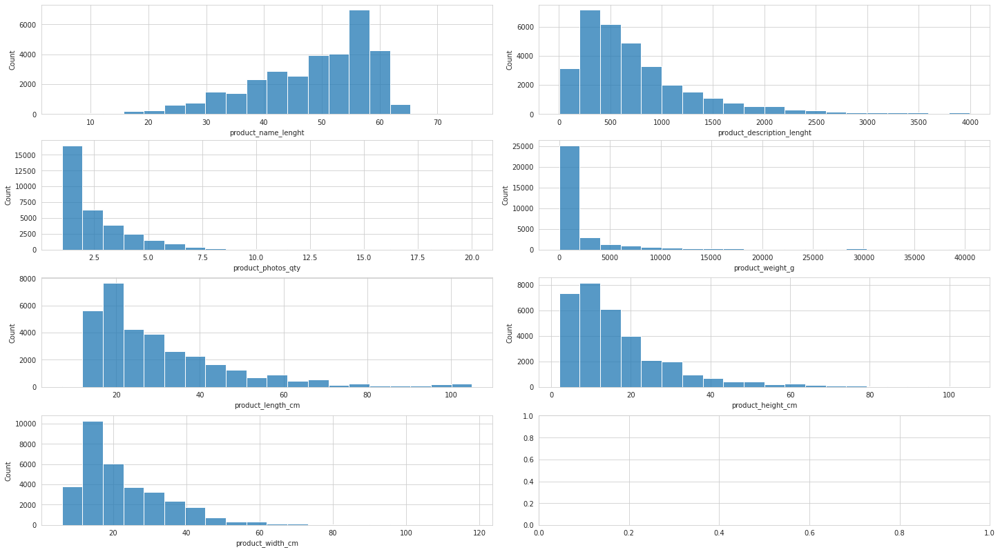

In [ ]:
# Select the required columns from the products DataFrame
products_dimentions = products.select(
    "product_name_lenght",
    "product_description_lenght",
    "product_photos_qty",
    "product_weight_g",
    "product_length_cm",
    "product_height_cm",
    "product_width_cm",
)

# Collect the products_dimentions data to the driver node
products_dimentions_data = products_dimentions.collect()

# Create a dictionary to hold the data
data_dict = {
    "product_name_lenght": [],
    "product_description_lenght": [],
    "product_photos_qty": [],
    "product_weight_g": [],
    "product_length_cm": [],
    "product_height_cm": [],
    "product_width_cm": [],
}

# Extract the data from the collected rows and populate the dictionary
for row in products_dimentions_data:
    data_dict["product_name_lenght"].append(row["product_name_lenght"])
    data_dict["product_description_lenght"].append(row["product_description_lenght"])
    data_dict["product_photos_qty"].append(row["product_photos_qty"])
    data_dict["product_weight_g"].append(row["product_weight_g"])
    data_dict["product_length_cm"].append(row["product_length_cm"])
    data_dict["product_height_cm"].append(row["product_height_cm"])
    data_dict["product_width_cm"].append(row["product_width_cm"])

# Draw the subplots
fig, ax = plt.subplots(4, 2, figsize=(20, 11), constrained_layout=True)

# Iterate over the variables and subplots
for var, subplot in zip(data_dict, ax.flatten()):
    # Create the histogram plot using Seaborn
    sns.histplot(data=data_dict[var], bins=20, ax=subplot, kde=False)
    subplot.set_xlabel(var)

# Display the plot
plt.show()

We are dropping the category name since we have too much categories and some of them are overlapping between each others, so we can't use them for the prediction.

In [ ]:
products = products.drop("product_category_name").dropna()

## Customer EDA

In [ ]:
customers.select(customers.columns).show(10)

+--------------------+--------------------+------------------------+--------------------+--------------+
|         customer_id|  customer_unique_id|customer_zip_code_prefix|       customer_city|customer_state|
+--------------------+--------------------+------------------------+--------------------+--------------+
|06b8999e2fba1a1fb...|861eff4711a542e4b...|                   14409|              franca|            SP|
|18955e83d337fd6b2...|290c77bc529b7ac93...|                    9790|sao bernardo do c...|            SP|
|4e7b3e00288586ebd...|060e732b5b29e8181...|                    1151|           sao paulo|            SP|
|b2b6027bc5c5109e5...|259dac757896d24d7...|                    8775|     mogi das cruzes|            SP|
|4f2d8ab171c80ec83...|345ecd01c38d18a90...|                   13056|            campinas|            SP|
|879864dab9bc30475...|4c93744516667ad3b...|                   89254|      jaragua do sul|            SC|
|fd826e7cf63160e53...|addec96d2e059c80c...|            

For our objective can be important to see if the states or the cities are influencing the score of the reviews.

In [ ]:
cities = customers.select("customer_city").distinct().count()
print("Number of unique cities: ", cities)

Number of unique cities:  4119


In [ ]:
states = customers.select("customer_state").distinct().count()
print("Number of states", states)

Number of states 27


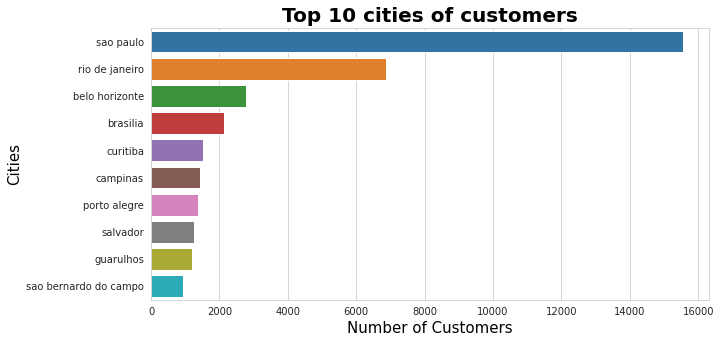

In [ ]:
# Group by customer_city and count occurrences
customer_city = (
    customers.groupBy("customer_city").count().orderBy("count", ascending=False)
)

# Collect the data to the driver node
customer_city_data = customer_city.limit(10).collect()

# Extract the city names and counts from the collected data
city_names = [row.customer_city for row in customer_city_data]
counts = [row["count"] for row in customer_city_data]

# Plotting
plt.figure(figsize=(10, 5))
sns.barplot(y=city_names, x=counts)
plt.xlabel("Number of Customers", color="black", fontsize=15)
plt.ylabel("Cities", color="black", fontsize=15)
plt.title("Top 10 cities of customers", color="black", fontsize=20, fontweight="bold")
plt.show()

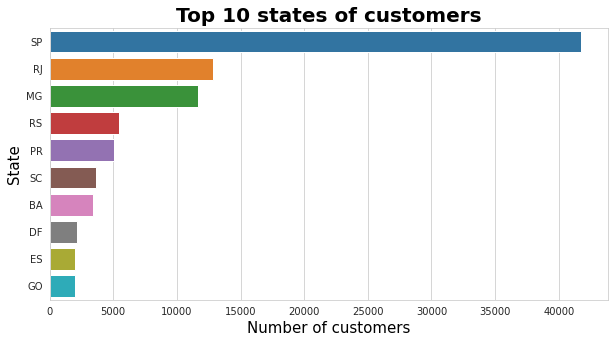

In [ ]:
# Group by customer_state and count the occurrences
customer_state = (
    customers.groupBy("customer_state").count().orderBy("count", ascending=False)
)

# Collect the customer_state data to the driver node
customer_state_data = customer_state.collect()

# Extract the count and customer_state values as lists
count_list = [row["count"] for row in customer_state_data]
state_list = [row["customer_state"] for row in customer_state_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x=count_list[:10], y=state_list[:10])

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Number of customers", color="black", fontsize=15)
plt.ylabel("State", color="black", fontsize=15)

# Set the title with font size and style
plt.title("Top 10 states of customers", color="black", fontsize=20, fontweight="bold")

# Display the plot
plt.show()

This graph is usefull because it show that most of the customers buy only once from partners managed by olist and this is a problem because we can't create features such as average score by customer.

/databricks/python/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


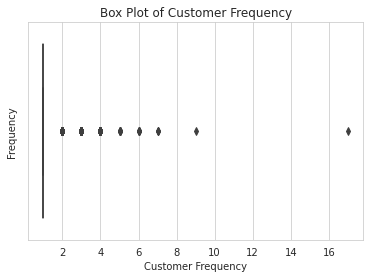

In [ ]:
# Count the frequency of each customer
customer_frequency = customers.groupBy("customer_unique_id").agg(
    count("*").alias("frequency")
)

# Collect the customer frequency data to the driver node
customer_frequency_data = customer_frequency.collect()

# Extract the frequency values as a list
frequency_list = [row["frequency"] for row in customer_frequency_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create a box plot using Seaborn
sns.boxplot(frequency_list)

# Set the title and axis labels
plt.xlabel("Customer Frequency")
plt.ylabel("Frequency")
plt.title("Box Plot of Customer Frequency")

# Display the plot
plt.show()

# Add visualization for the regions

In [ ]:
# adding regions to the costumer dataset
customers = customers.withColumn("customer_region", lit(None))

regions_data = regions.collect()

for i in regions_data:
    customers = customers.withColumn(
        "customer_region",
        when(col("customer_state") == i.state, i.region).otherwise(
            col("customer_region")
        ),
    )

In [ ]:
customers.show()

+--------------------+--------------------+------------------------+--------------------+--------------+---------------+
|         customer_id|  customer_unique_id|customer_zip_code_prefix|       customer_city|customer_state|customer_region|
+--------------------+--------------------+------------------------+--------------------+--------------+---------------+
|06b8999e2fba1a1fb...|861eff4711a542e4b...|                   14409|              franca|            SP|      Southeast|
|18955e83d337fd6b2...|290c77bc529b7ac93...|                    9790|sao bernardo do c...|            SP|      Southeast|
|4e7b3e00288586ebd...|060e732b5b29e8181...|                    1151|           sao paulo|            SP|      Southeast|
|b2b6027bc5c5109e5...|259dac757896d24d7...|                    8775|     mogi das cruzes|            SP|      Southeast|
|4f2d8ab171c80ec83...|345ecd01c38d18a90...|                   13056|            campinas|            SP|      Southeast|
|879864dab9bc30475...|4c93744516

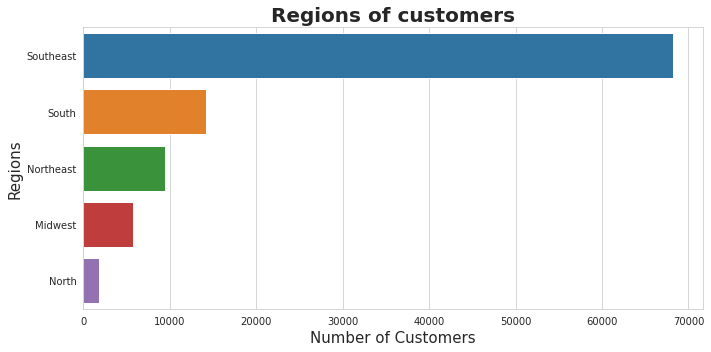

In [ ]:
# Group by customer_region and count the occurrences
customer_region = (
    customers.groupBy("customer_region").count().orderBy(col("count").desc())
)

# Convert the DataFrame to a list of dictionaries
region_data = customer_region.collect()

# Extract the region and count values as lists
region_list = [row["customer_region"] for row in region_data]
count_list = [row["count"] for row in region_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Set the size of the figure
plt.figure(figsize=(10, 5))

# Create the bar plot using Seaborn
ax = sns.barplot(x=count_list, y=region_list)

# Set the title and axis labels with font sizes and styles
ax.set_title("Regions of customers", fontsize=20, fontweight="bold")
ax.set_xlabel("Number of Customers", fontsize=15)
ax.set_ylabel("Regions", fontsize=15)

# Display the plot
plt.tight_layout()
plt.show()

For the purpose of our analysis later we will need to join all the tables and we will not need all of them for the analysis, so since we are supposed to work with big data we will drop the columns that we don't need before doing the join.

In [ ]:
customers = customers.drop(
    "customer_unique_id", "customer_zip_code_prefix", "customer_city", "customer_state"
)

## Items EDA

From the table below we can see the features about items dataset, one usefull thing is to count how many times each single seller have shipped a product.

In [ ]:
items.select("*").show(3)

+--------------------+-------------+--------------------+--------------------+-------------------+-----+-------------+
|            order_id|order_item_id|          product_id|           seller_id|shipping_limit_date|price|freight_value|
+--------------------+-------------+--------------------+--------------------+-------------------+-----+-------------+
|00010242fe8c5a6d1...|            1|4244733e06e7ecb49...|48436dade18ac8b2b...|2017-09-19 09:45:35| 58.9|        13.29|
|00018f77f2f0320c5...|            1|e5f2d52b802189ee6...|dd7ddc04e1b6c2c61...|2017-05-03 11:05:13|239.9|        19.93|
|000229ec398224ef6...|            1|c777355d18b72b67a...|5b51032eddd242adc...|2018-01-18 14:48:30|199.0|        17.87|
+--------------------+-------------+--------------------+--------------------+-------------------+-----+-------------+
only showing top 3 rows



In [ ]:
items.describe().show()

+-------+--------------------+------------------+--------------------+--------------------+------------------+------------------+
|summary|            order_id|     order_item_id|          product_id|           seller_id|             price|     freight_value|
+-------+--------------------+------------------+--------------------+--------------------+------------------+------------------+
|  count|              112650|            112650|              112650|              112650|            112650|            112650|
|   mean|                null|1.1978339991122948|                null|                null|120.65373901464174|19.990319928982977|
| stddev|                null|0.7051240313951721|                null|                null| 183.6339280502595|15.806405412297098|
|    min|00010242fe8c5a6d1...|                 1|00066f42aeeb9f300...|0015a82c2db000af6...|              0.85|               0.0|
|    max|fffe41c64501cc87c...|                21|fffe9eeff12fcbd74...|ffff564a4f9085cd2...

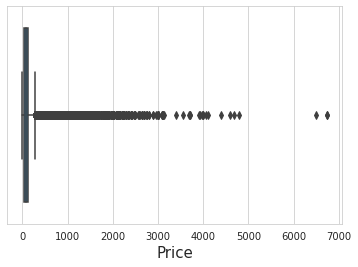

In [ ]:
# Extract the price column as a list using PySpark DataFrame
price_list = items.select("price").rdd.flatMap(lambda x: x).collect()

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the boxplot using Seaborn
sns.boxplot(x=price_list)
plt.xlabel("Price", fontsize=15)

# Display the plot
plt.show()

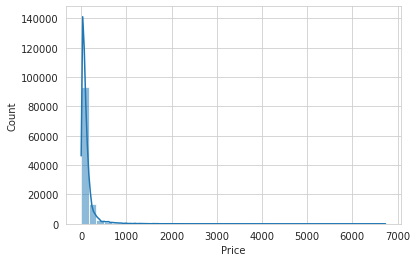

In [ ]:
# Select the "price" column and collect the data to the driver node
price_data = items.select("price").collect()

# Extract the price values as a list
price_list = [row["price"] for row in price_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the histogram plot using Seaborn
sns.histplot(data=price_list, bins=40, kde=True)

# Set the x-axis label
plt.xlabel("Price")

# Display the plot
plt.show()

Let's how many outliers do we have.

In [ ]:
items.filter(items.price > 1000).count()

Out[246]: 844

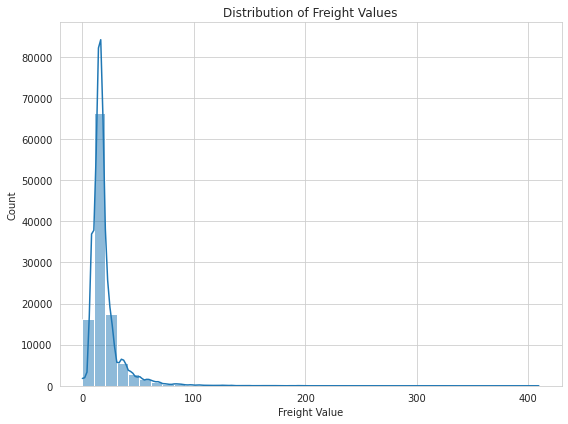

In [ ]:
# Select the desired column using PySpark
freight_value = items.select("freight_value")

# Convert the column to a list
freight_value_list = [row["freight_value"] for row in freight_value.collect()]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the figure and axes
fig, ax = plt.subplots(figsize=(8, 6))

# Create the histogram using Seaborn
sns.histplot(data=freight_value_list, bins=40, ax=ax, kde=True)

# Set the axis labels and title
ax.set_xlabel("Freight Value")
ax.set_ylabel("Count")
ax.set_title("Distribution of Freight Values")

# Display the plot
plt.tight_layout()
plt.show()

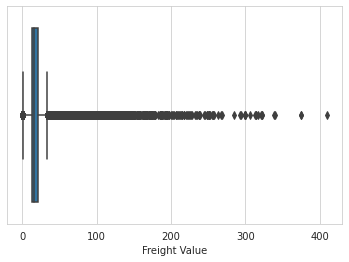

In [ ]:
# Select the "freight_value" column and collect the data to the driver node
freight_value_data = items.select("freight_value").collect()

# Extract the freight_value values as a list
freight_value_list = [row["freight_value"] for row in freight_value_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the box plot using Seaborn
sns.boxplot(x=freight_value_list)

# Set the x-axis label
plt.xlabel("Freight Value")

# Display the plot
plt.show()

Let's see how many outliers do we have.

In [ ]:
items.filter(items.freight_value > 100).count()

Out[249]: 671

Let's see if the freight value is correlated to the price

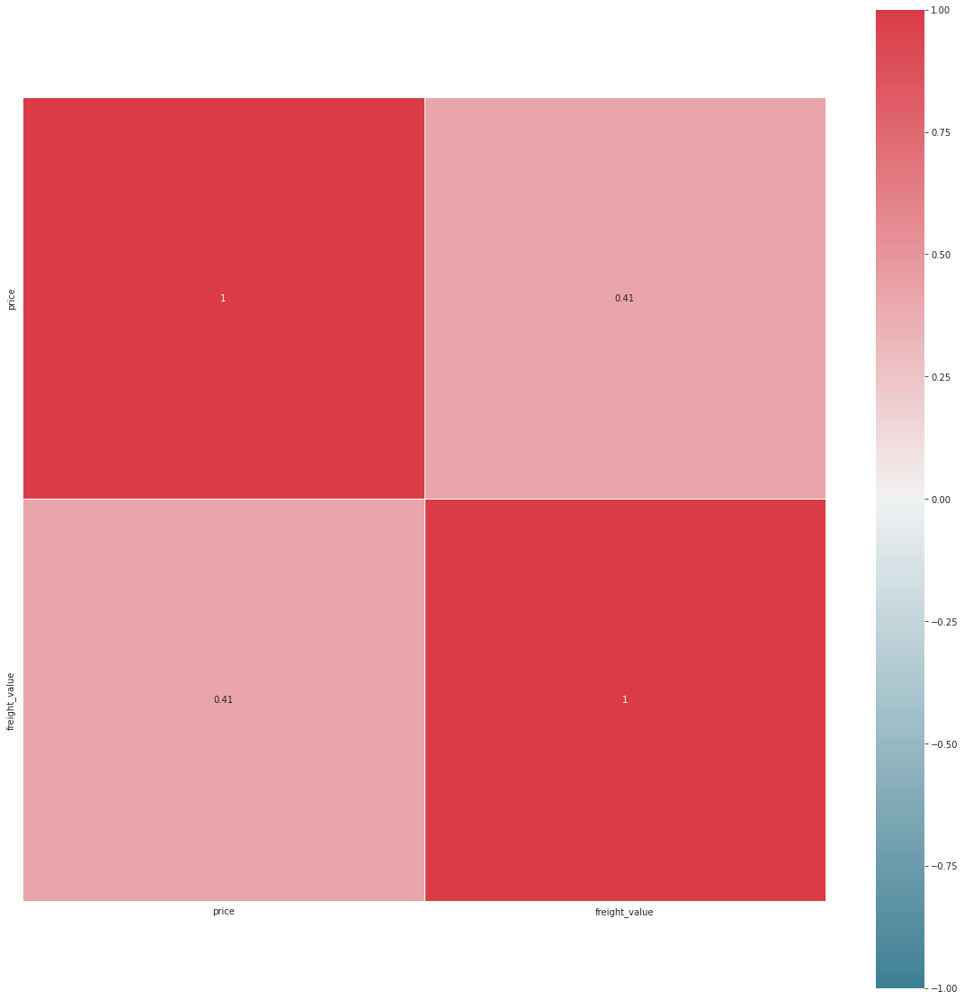

In [ ]:
# Specify the input columns you want to assemble into a vector
input_cols = ["price", "freight_value"]

# Create a VectorAssembler instance
assembler = VectorAssembler(inputCols=input_cols, outputCol="features")

# Transform the Spark DataFrame using the VectorAssembler
vector_df = assembler.transform(items).select("features")

pearsonCorr = (
    Correlation.corr(vector_df, "features", "pearson").collect()[0][0].toArray()
)

# Set the figsize
plt.figure(figsize=(20, 20))

# Plot heatmap of the correlation matrix
heatmap = sns.heatmap(
    data=pearsonCorr,
    xticklabels=input_cols,
    yticklabels=input_cols,
    annot=True,
    cmap=sns.diverging_palette(220, 10, as_cmap=True),
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=0.5,
)

# Set the x-axis and y-axis label font size
heatmap.set_xlabel(heatmap.get_xlabel(), fontsize=16)
heatmap.set_ylabel(heatmap.get_ylabel(), fontsize=16)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

We will delete this features since we don't need them for the model.

In [ ]:
items = items.drop("seller_id", "shipping_limit_date")

## Payment EDA

In [ ]:
payments.describe().show()

+-------+--------------------+------------------+------------+--------------------+------------------+
|summary|            order_id|payment_sequential|payment_type|payment_installments|     payment_value|
+-------+--------------------+------------------+------------+--------------------+------------------+
|  count|              103886|            103886|      103886|              103886|            103886|
|   mean|                null|1.0926785129853878|        null|   2.853348863176944|154.10038041698792|
| stddev|                null|0.7065837791949958|        null|   2.687050673856492|  217.494063864724|
|    min|00010242fe8c5a6d1...|                 1|      boleto|                   0|               0.0|
|    max|fffe41c64501cc87c...|                29|     voucher|                  24|          13664.08|
+-------+--------------------+------------------+------------+--------------------+------------------+



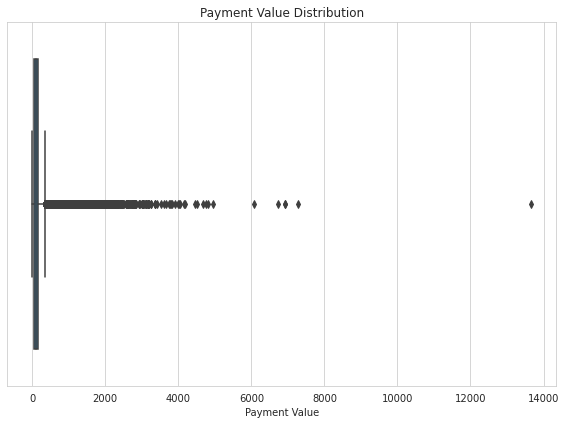

In [ ]:
# Extract the payment_value column as a list
value_list = payments.select("payment_value").rdd.flatMap(lambda x: x).collect()

# Set the Seaborn style
sns.set_style("whitegrid")

# Set the size of the figure
plt.figure(figsize=(8, 6))

# Create the box plot using Seaborn
ax = sns.boxplot(x=value_list)

# Set the title and axis labels using Seaborn's set() function
ax.set_title("Payment Value Distribution")
ax.set_xlabel("Payment Value")

# Display the plot
plt.tight_layout()
plt.show()

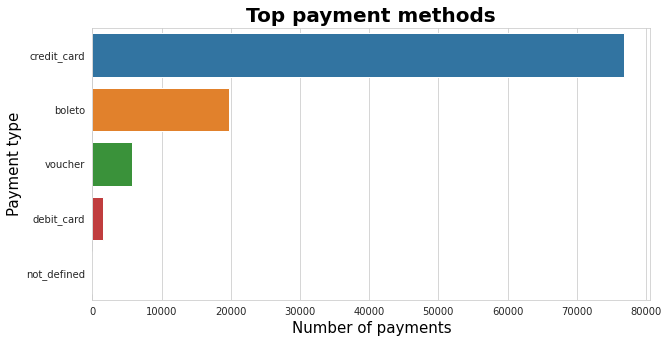

In [ ]:
# Group by payment_type and count the occurrences
payment_type = (
    payments.groupBy("payment_type").count().orderBy("count", ascending=False)
)

# Collect the payment_type data to the driver node
payment_type_data = payment_type.limit(10).collect()

# Extract the payment type and count values as lists
payment_type_list = [row["payment_type"] for row in payment_type_data]
count_list = [row["count"] for row in payment_type_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(y=payment_type_list, x=count_list)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Number of payments", color="black", fontsize=15)
plt.ylabel("Payment type", color="black", fontsize=15)

# Set the title with font size and style
plt.title("Top payment methods", color="black", fontsize=20, fontweight="bold")

# Display the plot
plt.show()

Below we can see that some people are using more then 1 payment type, this can happen for example if you have one voucher and you pay with the voucher and another payment type.  
Since most of the values belong to only one method the only way to use this feature is creating a new one for all the rows with more than 1 method.

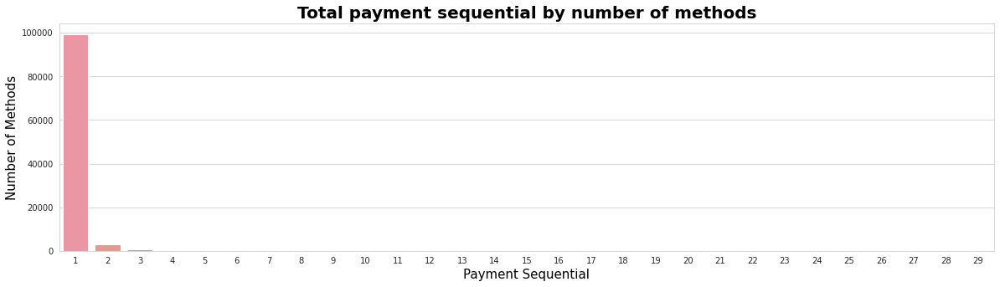

In [ ]:
# Group by payment_sequential and count the occurrences
sequential = (
    payments.groupBy("payment_sequential").count().orderBy("count", ascending=False)
)

# Collect the sequential data to the driver node
sequential_data = sequential.collect()

# Extract the count and payment_sequential values as lists
count_list = [row["count"] for row in sequential_data]
sequential_list = [row["payment_sequential"] for row in sequential_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(20, 5))
sns.barplot(y=count_list, x=sequential_list)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Payment Sequential", color="black", fontsize=15)
plt.ylabel("Number of Methods", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Total payment sequential by number of methods",
    color="black",
    fontsize=20,
    fontweight="bold",
)

# Display the plot
plt.show()

As we can see most of the payment sequential with more than 1 are done with voucher, so for our goal this feature is useless.  
First because is highly unbalanced, and second has an high correlation with payment type.

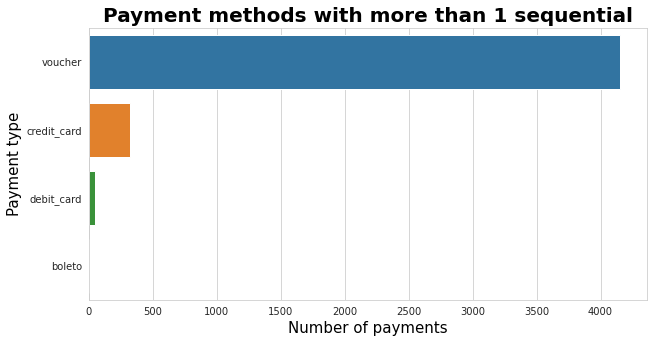

In [ ]:
# Filter the payments DataFrame by payment_sequential > 1 and group by payment_type
payment_type = (
    payments.filter("payment_sequential > 1")
    .groupBy("payment_type")
    .count()
    .orderBy("count", ascending=False)
)

# Collect the payment_type data to the driver node
payment_type_data = payment_type.limit(10).collect()

# Extract the payment type and count values as lists
payment_type_list = [row["payment_type"] for row in payment_type_data]
count_list = [row["count"] for row in payment_type_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(y=payment_type_list, x=count_list)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Number of payments", color="black", fontsize=15)
plt.ylabel("Payment type", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Payment methods with more than 1 sequential",
    color="black",
    fontsize=20,
    fontweight="bold",
)

# Display the plot
plt.show()

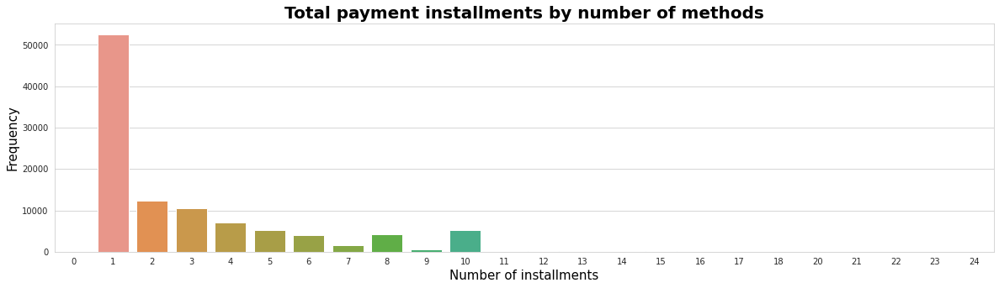

In [ ]:
# Group by payment_installments and count the occurrences
installments = (
    payments.groupBy("payment_installments").count().orderBy("count", ascending=False)
)

# Collect the installments data to the driver node
installments_data = installments.collect()

# Extract the count and payment_installments values as lists
count_list = [row["count"] for row in installments_data]
installments_list = [row["payment_installments"] for row in installments_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(20, 5))
sns.barplot(y=count_list, x=installments_list)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Number of installments", color="black", fontsize=15)
plt.ylabel("Frequency", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Total payment installments by number of methods",
    color="black",
    fontsize=20,
    fontweight="bold",
)

# Display the plot
plt.show()

From the graph above we noticed that we have some rows with zero as number of installments which is not possible, so we will drop this two rows.  
We can also see that half of this values belong to 1 installment, so we will do feature engineering in order to have only two category.

In [ ]:
payments.select("*").filter("payment_installments == 0").show()

+--------------------+------------------+------------+--------------------+-------------+
|            order_id|payment_sequential|payment_type|payment_installments|payment_value|
+--------------------+------------------+------------+--------------------+-------------+
|744bade1fcf9ff3f3...|                 2| credit_card|                   0|        58.69|
|1a57108394169c0b4...|                 2| credit_card|                   0|       129.94|
+--------------------+------------------+------------+--------------------+-------------+



Also the feature engineering is better to be done before the join, in this case we have two benefits on doing this. First variables that are only needed for the features engineering will not joined because they can be dropped before the join. Second during the join new lines will be created, so doing the engineering before is faster than doing after.

In [ ]:
# we create a new feature and drop the ones that we don't need
payments = payments.withColumn(
    "more_than_one_installments", when(col("payment_installments") > 1, 1).otherwise(0)
)
payments = payments.select("order_id", "payment_type", "more_than_one_installments")

## Reviews EDA

We can create a feature where we can see how many days are passed between the creation date and the answer date.

In [ ]:
reviews.select("*").show()

+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|           review_id|            order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+--------------------+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|7bc2406110b926393...|73fc7af87114b3971...|           4|                null|                  null| 2018-01-18 00:00:00|    2018-01-18 21:46:59|
|80e641a11e56f04c1...|a548910a1c6147796...|           5|                null|                  null| 2018-03-10 00:00:00|    2018-03-11 03:05:13|
|228ce5500dc1d8e02...|f9e4b658b201a9f2e...|           5|                null|                  null| 2018-02-17 00:00:00|    2018-02-18 14:36:24|
|e64fb393e7b32834b...|658677c97b385a9be...|           5|                null|  Recebi bem antes ...| 2017-04-21 00:00:00|   

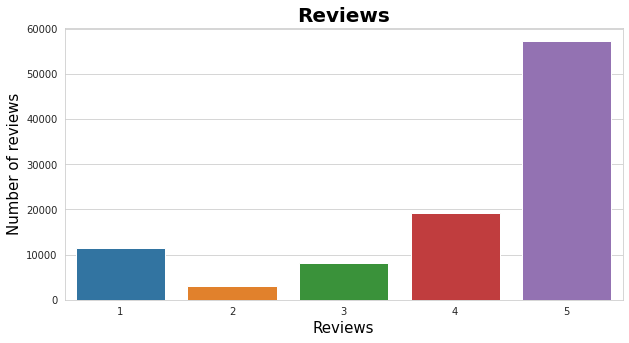

In [ ]:
# Group by review_score and count the occurrences
review_score = reviews.groupBy("review_score").count().orderBy("count", ascending=False)

# Collect the review_score data to the driver node
review_score_data = review_score.collect()

# Extract the count and review_score values as lists
count_list = [row["count"] for row in review_score_data]
review_score_list = [row["review_score"] for row in review_score_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(y=count_list[:5], x=review_score_list[:5])

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Reviews", color="black", fontsize=15)
plt.ylabel("Number of reviews", color="black", fontsize=15)

# Set the title with font size and style
plt.title("Reviews", color="black", fontsize=20, fontweight="bold")

# Display the plot
plt.show()

Check missing values

In [ ]:
reviews.select(
    [count(when(col(c).isNull(), c)).alias(c) for c in reviews.columns]
).show()

+---------+--------+------------+--------------------+----------------------+--------------------+-----------------------+
|review_id|order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+---------+--------+------------+--------------------+----------------------+--------------------+-----------------------+
|        0|       0|           0|               87656|                 58247|                   0|                      0|
+---------+--------+------------+--------------------+----------------------+--------------------+-----------------------+



Here we can see that we have more order_id than review_id.

In [ ]:
reviews.select("review_id").distinct().count()

Out[263]: 98410

In [ ]:
reviews.select("order_id").distinct().count()

Out[264]: 98673

And as we can see some of these are duplicated which is strange because the review_id is not supposed to be duplicated.

In [ ]:
reviews.select("*").distinct().count()

Out[265]: 99224

We don't know why but we have some review_id that are duplicated and they have different order_id. 
Going on kaggle we saw that we are not the only one that have noticed the problem, the guy from Olist that have uploaded the dataset has try to check but he didn't know why there is this issue and he wasn't able to fix on the realeses that they have done. So since this problem effect a small number of observations, and we don't have a way to fix the issue we will drop all this obsevations.

In [ ]:
reviews.groupBy("review_id").count().join(reviews, "review_id", "full").filter(
    "count > 1"
).count()

Out[266]: 1603

In [ ]:
reviews.groupBy("review_id").count().join(reviews, "review_id", "full").filter(
    "count > 1"
).show()

+--------------------+-----+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|           review_id|count|            order_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+--------------------+-----+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|f144ac19984746532...|    2|df3e4e0056f83d44b...|           5|                null|                  null| 2018-02-06 00:00:00|    2018-02-07 14:37:49|
|f144ac19984746532...|    2|ebe8e5e35f85b19e3...|           5|                null|                  null| 2018-02-06 00:00:00|    2018-02-07 14:37:49|
|e4f5fbbbf2fa8f259...|    2|bdf15710eda59b7ed...|           5|                null|                  null| 2017-11-10 00:00:00|    2017-11-10 17:51:00|
|e4f5fbbbf2fa8f259...|    2|ff259720a6c1397ed...|           5|                null|     

In [ ]:
reviews = (
    reviews.groupBy("review_id")
    .count()
    .join(reviews, "review_id", "full")
    .filter("count == 1")
    .drop("count")
)

Here we can see that the order_id that are duplicated belong to reviews that are being updated in someway by the user, since they have differnt timestamp. So we need to sort them by timestap and delete the first one in order to keep the most recent one.

In [ ]:
duplicated = reviews.groupBy("order_id").count()
duplicated.join(reviews, "order_id", "full").filter("count > 1").show()

+--------------------+-----+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|            order_id|count|           review_id|review_score|review_comment_title|review_comment_message|review_creation_date|review_answer_timestamp|
+--------------------+-----+--------------------+------------+--------------------+----------------------+--------------------+-----------------------+
|f63a31c3349b87273...|    2|bc85f39adbafaddfd...|           5|                null|                  null| 2018-01-11 00:00:00|    2018-01-12 02:05:02|
|f63a31c3349b87273...|    2|d5afe15f58c18e891...|           5|                null|                  null| 2018-01-09 00:00:00|    2018-01-12 02:04:24|
|92e0a2b039d9ce627...|    2|8e5f7e3f30dffe40e...|           3|                null|                  null| 2017-11-30 00:00:00|    2017-12-01 02:20:36|
|92e0a2b039d9ce627...|    2|d8a52b8014cfd3ddb...|           3|                null|     

Here we delete the duplicates and since pyspark with the function dropDuplicates drop the second row and not the first one we sorted by review_answer_timestamp.

In [ ]:
reviews = (
    reviews.sort(asc("review_answer_timestamp"))
    .dropDuplicates(["order_id"])
    .select("order_id", "review_id", "review_score")
)

## Order EDA

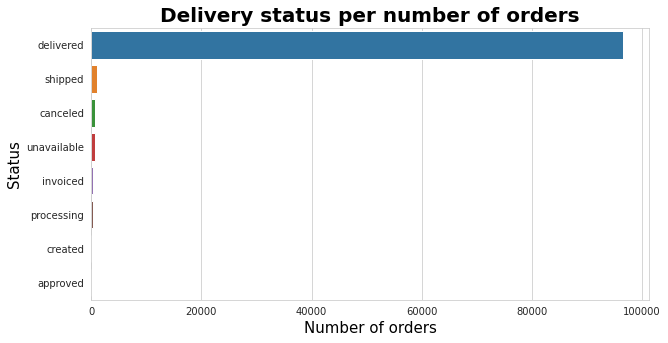

In [ ]:
# Group by order_status and count the occurrences
order_status = orders.groupBy("order_status").count().orderBy("count", ascending=False)

# Collect the order_status data to the driver node
order_status_data = order_status.collect()

# Extract the count and order_status values as lists
count_list = [row["count"] for row in order_status_data]
order_status_list = [row["order_status"] for row in order_status_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(y=order_status_list[:10], x=count_list[:10])

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Number of orders", color="black", fontsize=15)
plt.ylabel("Status", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Delivery status per number of orders",
    color="black",
    fontsize=20,
    fontweight="bold",
)

# Display the plot
plt.show()

In [ ]:
order_status

Out[272]: DataFrame[order_status: string, count: bigint]

order_delivered_customer_date missing values are caused by all the status beside delivered.

In [ ]:
orders.select([count(when(col(c).isNull(), c)).alias(c) for c in orders.columns]).show()

+--------+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+
|order_id|customer_id|order_status|order_purchase_timestamp|order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|
+--------+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+
|       0|          0|           0|                       0|              160|                        1783|                         2965|                            0|
+--------+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+



Since our objective is to predict the score of the review we will consider only the delivered orders, as we can see we have some missing values that we will drop since they are few.

In [ ]:
orders.filter(orders.order_status == "delivered").select(
    [count(when(col(c).isNull(), c)).alias(c) for c in orders.columns]
).show()

+--------+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+
|order_id|customer_id|order_status|order_purchase_timestamp|order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|
+--------+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+
|       0|          0|           0|                       0|               14|                           2|                            8|                            0|
+--------+-----------+------------+------------------------+-----------------+----------------------------+-----------------------------+-----------------------------+



We will consider only the difference between purchase timestamp and approved, and between delivered and estimated. Since we belive that they can influece the score.

In [ ]:
orders.show()

+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+
|            order_id|         customer_id|order_status|order_purchase_timestamp|  order_approved_at|order_delivered_carrier_date|order_delivered_customer_date|order_estimated_delivery_date|
+--------------------+--------------------+------------+------------------------+-------------------+----------------------------+-----------------------------+-----------------------------+
|e481f51cbdc54678b...|9ef432eb625129730...|   delivered|     2017-10-02 10:56:33|2017-10-02 11:07:15|         2017-10-04 19:55:00|          2017-10-10 21:25:13|          2017-10-18 00:00:00|
|53cdb2fc8bc7dce0b...|b0830fb4747a6c6d2...|   delivered|     2018-07-24 20:41:37|2018-07-26 03:24:27|         2018-07-26 14:31:00|          2018-08-07 15:27:45|          2018-08-13 00:00:00|
|47770eb9100c2d0c4...|41ce2a54c0b03bf34...|  

We made two new variables and we droped that ones that we no longer need. As we can see we have some missing values, that was espected since we already spot them in the previus analysis, so after the creation of the new variables we drop the rows that have some missing values.  
estimated_vs_delivered is the difference in days between when the order was estimated to arrive and when it was acctually delivered, the difference is in days since the prediction predict the day and not the hour.  
time_to_be_approved is the difference in seconds since when the order was approved and when it was purchase, in this case is in seconds because for both the columns we also have the seconds.

In [ ]:
orders = (
    orders.withColumn(
        "time_to_be_approved",
        col("order_approved_at").cast("long")
        - col("order_purchase_timestamp").cast("long"),
    )
    .select(
        col("order_id"),
        col("customer_id"),
        col("order_status"),
        col("time_to_be_approved"),
        datediff(
            col("order_delivered_customer_date"), col("order_estimated_delivery_date")
        ).alias("estimated_vs_delivered"),
    )
    .dropna()
)

# Merge all the datasets

Since we are supposed to work with big data as we said before we already have done some cleaning table by table in order to not join useless columns and we have done some cleaning also during the join process.  
First thing since we want only the delivered orders we have used the filter in order to have only that one and then for each join we made an inner join in order to not create missing values. We know that this process lead to missing values because we have done this before with an outter join and we have seen that the keys dosen't match 100%.  
Then the last optimization that we have performed was to drop the key columns that we no longer need after we used them to merge the tables.

<img src="/files/tables/db_schema.png" alt="Database schema" width="50%" height="50%" style="display: block; margin-left: auto; margin-right: auto; width: 50%;">

In [ ]:
ds = (
    orders.filter(orders.order_status == "delivered")
    .join(reviews, "order_id", "inner")
    .drop("order_status")
    .select("*")
)
ds = (
    ds.join(customers, "customer_id", "inner").drop("customer_id").select("*")
)  # here maybe we will need to put back customer_id
ds = ds.join(payments, "order_id", "inner").select("*")
ds = ds.join(items, "order_id", "inner").select("*")
ds = ds.join(products, "product_id", "inner").select("*")

ds.select(ds.columns[0:9]).show(3)
ds.select(ds.columns[9:19]).show(3)
ds.select(ds.columns[19:29]).show(3)

+--------------------+--------------------+-------------------+----------------------+--------------------+------------+---------------+------------+--------------------------+
|          product_id|            order_id|time_to_be_approved|estimated_vs_delivered|           review_id|review_score|customer_region|payment_type|more_than_one_installments|
+--------------------+--------------------+-------------------+----------------------+--------------------+------------+---------------+------------+--------------------------+
|e5f2d52b802189ee6...|00018f77f2f0320c5...|                727|                    -3|7b07bacd811c4117b...|           4|      Southeast| credit_card|                         1|
|ac6c3623068f30de0...|00042b26cf59d7ce6...|                742|                   -16|940144190dcba6351...|           5|      Southeast| credit_card|                         1|
|8d4f2bb7e93e6710a...|00054e8431b9d7675...|               1003|                   -17|0381de7572d99d752...|        

# Merged data EDA

Checking how many non-null values we have in each columns.

In [ ]:
display(ds.select([sum(col(c).isNull().cast("int")).alias(c) for c in ds.columns]))

product_id,order_id,time_to_be_approved,estimated_vs_delivered,review_id,review_score,customer_region,payment_type,more_than_one_installments,order_item_id,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


We can notice that apparently the order_item_id is not what is written on the explanation of the dataset or at least what we understood. The order_item_id is an id about a single product inside an order, so if you make an order with more than one different product each product will have a different order_item_id but the same oder_id.

In [ ]:
ds.groupBy("review_id").count().join(ds, "review_id", "full").filter(
    "count > 1"
).select(
    "review_id",
    "count",
    "order_id",
    "order_item_id",
    "price",
    "freight_value",
    "product_id",
).show()

+--------------------+-----+--------------------+-------------+-----+-------------+--------------------+
|           review_id|count|            order_id|order_item_id|price|freight_value|          product_id|
+--------------------+-----+--------------------+-------------+-----+-------------+--------------------+
|909f3a54efd4fbfbd...|    5|08e4ccc1239f87c92...|            1| 29.9|        22.16|ac5e164e2eda939ff...|
|909f3a54efd4fbfbd...|    5|08e4ccc1239f87c92...|            2| 27.9|        12.46|40376ad8bd1bd1066...|
|909f3a54efd4fbfbd...|    5|08e4ccc1239f87c92...|            3| 27.9|         9.69|834df04774f3aa4b6...|
|909f3a54efd4fbfbd...|    5|08e4ccc1239f87c92...|            4| 27.9|        12.47|39a0578866cba21bc...|
|909f3a54efd4fbfbd...|    5|08e4ccc1239f87c92...|            5| 29.9|        22.16|ac5e164e2eda939ff...|
|44051e08b768c995f...|    3|09ec142bfa34576d3...|            1| 14.9|         9.22|eeba3ee5aa7d1d571...|
|44051e08b768c995f...|    3|09ec142bfa34576d3...|      

Here we count how many order we have with more than 1 item in the order.

In [ ]:
ds.groupBy("review_id").count().join(ds, "review_id", "full").filter(
    "count > 1"
).count()

Out[57]: 29602

Here how many orders with the same item bought more than once inside.

In [ ]:
ds.groupBy("review_id", "product_id").count().join(ds, "review_id", "full").filter(
    "count > 1"
).count()

Out[58]: 25574

In [ ]:
avg_scores = ds.groupBy("product_id").agg(
    avg("review_score").alias("average_product_score")
)
ds = ds.join(avg_scores, on="product_id", how="left")

Check the distribution of how many time each single product was sold.

/databricks/python/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


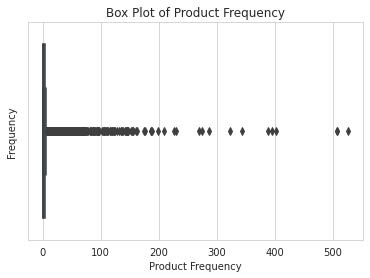

In [ ]:
# Count the frequency of each customer
product_frequency = ds.groupBy("product_id").count()

# Collect the customer frequency data to the driver node
product_frequency_data = product_frequency.collect()

# Extract the frequency values as a list
frequency_list = [row["count"] for row in product_frequency_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create a box plot using Seaborn
sns.boxplot(frequency_list)

# Set the title and axis labels
plt.xlabel("Product Frequency")
plt.ylabel("Frequency")
plt.title("Box Plot of Product Frequency")

# Display the plot
plt.show()

This can be a problem, since all the product sold only one time will have the same score of the review.

In [ ]:
ds.groupBy("product_id").count().filter("count = 1").count()

Out[216]: 16910

We only have around 4000 sold products that belong to orders with more than 1 different products, so since we can't know which one is the product that caused an high or low score on the review we will drop this observations. Before to do that we considered to create a new boolean variable to mark these orders to let know the algorithm that these orders have different products inside, but since they are a small percentage this solution will not work.  
We are also deleting all the id features because at this point we no longer need them.

In [ ]:
ds = (
    ds.drop("order_item_id")
    .dropDuplicates()
    .groupBy("review_id")
    .count()
    .join(ds, "review_id", "full")
    .filter("count == 1")
    .drop("count", "review_id", "product_id", "order_id", "order_item_id")
)

See how many obsevations do we have after removing the duplicates.

In [ ]:
ds.count()

Out[281]: 98126

As we can see the two variables time_to_be_approved and estimated_vs_delivered are influencing the final score as expected.

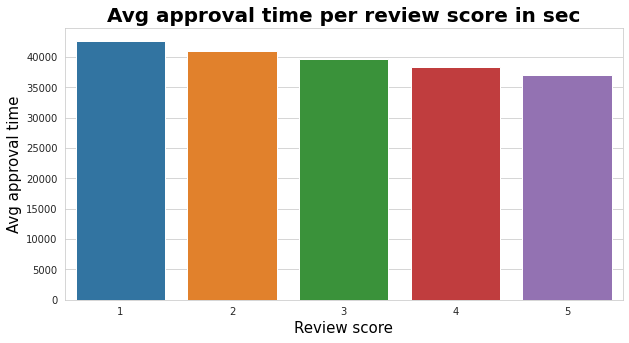

In [ ]:
# Group by review_score and calculate average time_to_be_approved
tempDs = ds.groupBy("review_score").avg("time_to_be_approved")

# Collect the tempDs data to the driver node
tempDs_data = tempDs.collect()

# Sort the collected data based on review_score
sorted_tempDs_data = sorted(tempDs_data, key=lambda x: x["review_score"])

# Extract the necessary columns from the sorted collected data
review_scores = [row["review_score"] for row in sorted_tempDs_data]
avg_approval_times = [row["avg(time_to_be_approved)"] for row in sorted_tempDs_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x=review_scores, y=avg_approval_times)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Review score", color="black", fontsize=15)
plt.ylabel("Avg approval time", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Avg approval time per review score in sec",
    color="black",
    fontsize=20,
    fontweight="bold",
)

# Display the plot
plt.show()

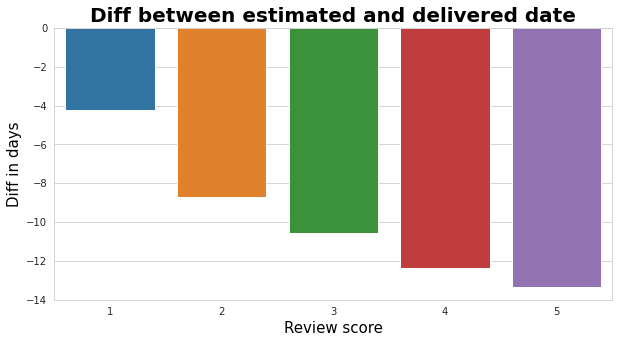

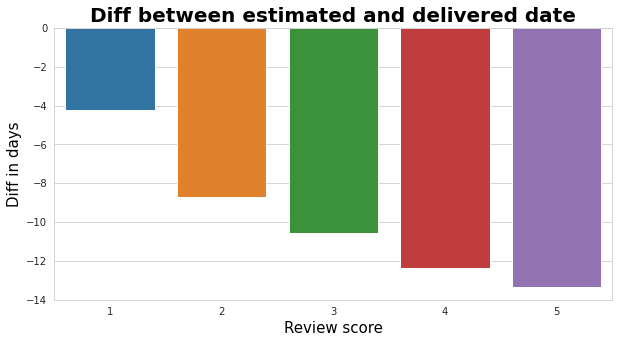

In [ ]:
# Group by review_score and calculate average estimated_vs_delivered
tempDs = ds.groupBy("review_score").avg("estimated_vs_delivered")

# Collect the tempDs data to the driver node
tempDs_data = tempDs.collect()

# Sort the collected data based on review_score
sorted_tempDs_data = sorted(tempDs_data, key=lambda x: x["review_score"])

# Extract the necessary columns from the sorted collected data
review_scores = [row["review_score"] for row in sorted_tempDs_data]
avg_diff_days = [row["avg(estimated_vs_delivered)"] for row in sorted_tempDs_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x=review_scores, y=avg_diff_days)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Review score", color="black", fontsize=15)
plt.ylabel("Diff in days", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Diff between estimated and delivered date",
    color="black",
    fontsize=20,
    fontweight="bold",
)

# Display the plot
plt.show()

The average score by region seem's like to be the same, but maybe the distribution between each score value change.

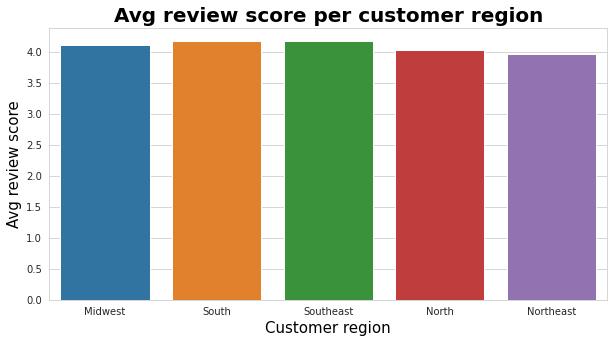

In [ ]:
# Group by customer_region and calculate average review_score
tempDs = ds.groupBy("customer_region").avg("review_score")

# Collect the data to the driver node
tempDs_data = tempDs.collect()

# Extract the necessary columns from the collected data
customer_region = [row["customer_region"] for row in tempDs_data]
avg_review_score = [row["avg(review_score)"] for row in tempDs_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x=customer_region, y=avg_review_score)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Customer region", color="black", fontsize=15)
plt.ylabel("Avg review score", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Avg review score per customer region",
    color="black",
    fontsize=20,
    fontweight="bold",
)

# Display the plot
plt.show()

As we can see below there is a difference that before we were not able to see, so the region can add some signal to our prediction model.

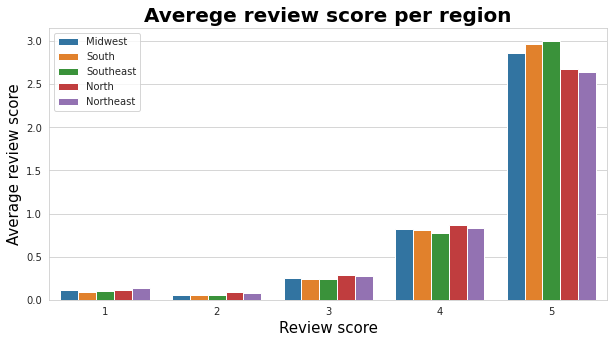

In [ ]:
# Group by customer_region and count the occurrences
tempDs = (
    ds.groupBy("customer_region")
    .count()
    .join(ds, "customer_region", "inner")
    .withColumn("review_region", col("review_score") / col("count"))
    .groupBy("review_score", "customer_region")
    .sum("review_region")
)

# Collect the tempDs data to the driver node
tempDs_data = tempDs.collect()

# Extract the necessary columns from the collected data
review_scores = [row["review_score"] for row in tempDs_data]
sum_review_regions = [row["sum(review_region)"] for row in tempDs_data]
customer_regions = [row["customer_region"] for row in tempDs_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x=review_scores, y=sum_review_regions, hue=customer_regions)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Review score", color="black", fontsize=15)
plt.ylabel("Average review score", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Averege review score per region", color="black", fontsize=20, fontweight="bold"
)

# Display the plot
plt.show()

Also the payment type has the same problem, after doing the distribution segemented by score we noticed that the difference is not so high.

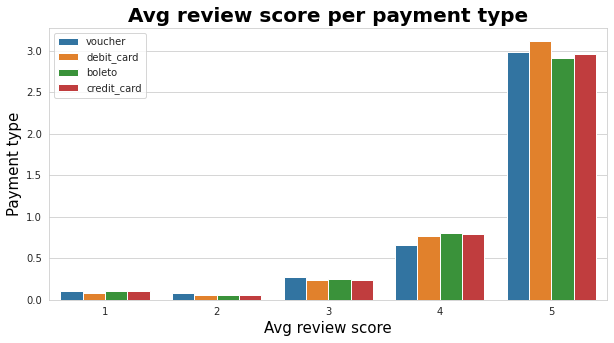

In [ ]:
# Group by payment_type and count the occurrences
tempDs = (
    ds.groupBy("payment_type")
    .count()
    .join(ds, "payment_type", "inner")
    .withColumn("review_payment_type", col("review_score") / col("count"))
    .groupBy("review_score", "payment_type")
    .sum("review_payment_type")
)

# Collect the data to the driver node
tempDs_data = tempDs.collect()

# Extract the necessary columns from the collected data
review_score = [row["review_score"] for row in tempDs_data]
sum_review_payment_type = [row["sum(review_payment_type)"] for row in tempDs_data]
payment_type = [row["payment_type"] for row in tempDs_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x=review_score, y=sum_review_payment_type, hue=payment_type)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Avg review score", color="black", fontsize=15)
plt.ylabel("Payment type", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Avg review score per payment type", color="black", fontsize=20, fontweight="bold"
)

# Display the plot
plt.show()

Here we can see a small difference in the distribution for the variable that show if there was one or more installments.

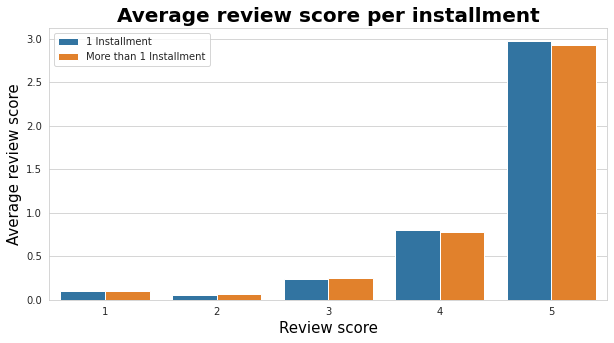

In [ ]:
# Group by more_than_one_installments and count the occurrences
tempDs = (
    ds.groupBy("more_than_one_installments")
    .count()
    .join(ds, "more_than_one_installments", "inner")
    .withColumn("review_region", col("review_score") / col("count"))
    .groupBy("review_score", "more_than_one_installments")
    .sum("review_region")
)

# Collect the tempDs data to the driver node
tempDs_data = tempDs.collect()

# Extract the necessary columns from the collected data
review_scores = [row["review_score"] for row in tempDs_data]
sum_review_regions = [row["sum(review_region)"] for row in tempDs_data]
more_than_one_installments = [
    "1 Installment" if value == 0 else "More than 1 Installment"
    for value in [row["more_than_one_installments"] for row in tempDs_data]
]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x=review_scores, y=sum_review_regions, hue=more_than_one_installments)

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Review score", color="black", fontsize=15)
plt.ylabel("Average review score", color="black", fontsize=15)

# Set the title with font size and style
plt.title(
    "Average review score per installment",
    color="black",
    fontsize=20,
    fontweight="bold",
)

# Display the plot
plt.show()

Now we plot all the intervall data average to see which one impact more the score.

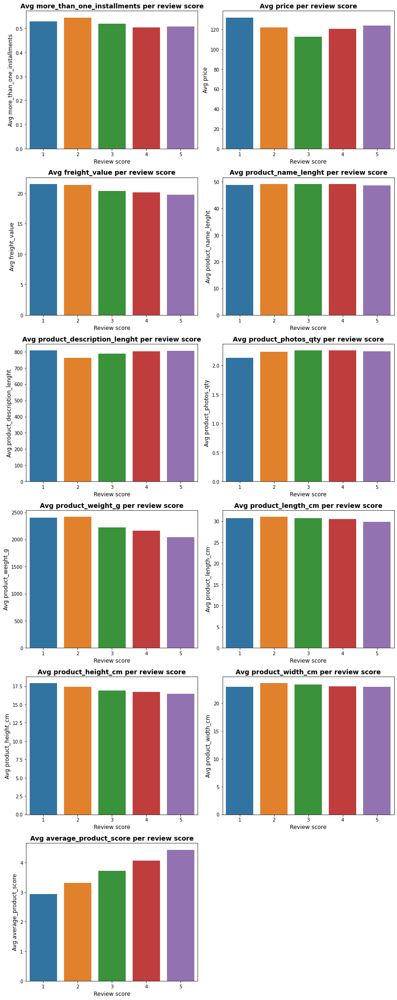

In [ ]:
# Assuming you have a Spark DataFrame called ds

# Get the columns starting from the 6th column
columns = ds.columns[5:]

# Calculate the number of rows and columns for subplots
num_rows = (len(columns) + 1) // 2
num_cols = 2

# Create subplots for each column
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 5 * num_rows))

# Flatten the axes array if necessary
axes = axes.flatten() if num_rows > 1 else [axes]

# Iterate over each column
for i, column in enumerate(columns):
    ax = axes[i]

    # Perform groupBy and average calculation in a single step
    tempList = ds.groupBy("review_score").avg(column).collect()

    # Extract the required data from the collected list
    review_scores = [row["review_score"] for row in tempList]
    avg_values = [row["avg({})".format(column)] for row in tempList]

    # Plot the bar chart
    sns.barplot(x=review_scores, y=avg_values, ax=ax)
    ax.set_ylabel("Avg {}".format(column), color="black", fontsize=12)
    ax.set_xlabel("Review score", color="black", fontsize=12)
    ax.set_title(
        "Avg {} per review score".format(column),
        color="black",
        fontsize=14,
        fontweight="bold",
    )

# Remove any unused subplots
if len(columns) < len(axes):
    for j in range(len(columns), len(axes)):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Printing columns names and looking at the correlation matrix.

In [ ]:
ds.columns

Out[282]: ['time_to_be_approved',
 'estimated_vs_delivered',
 'review_score',
 'customer_region',
 'payment_type',
 'more_than_one_installments',
 'price',
 'freight_value',
 'product_name_lenght',
 'product_description_lenght',
 'product_photos_qty',
 'product_weight_g',
 'product_length_cm',
 'product_height_cm',
 'product_width_cm']

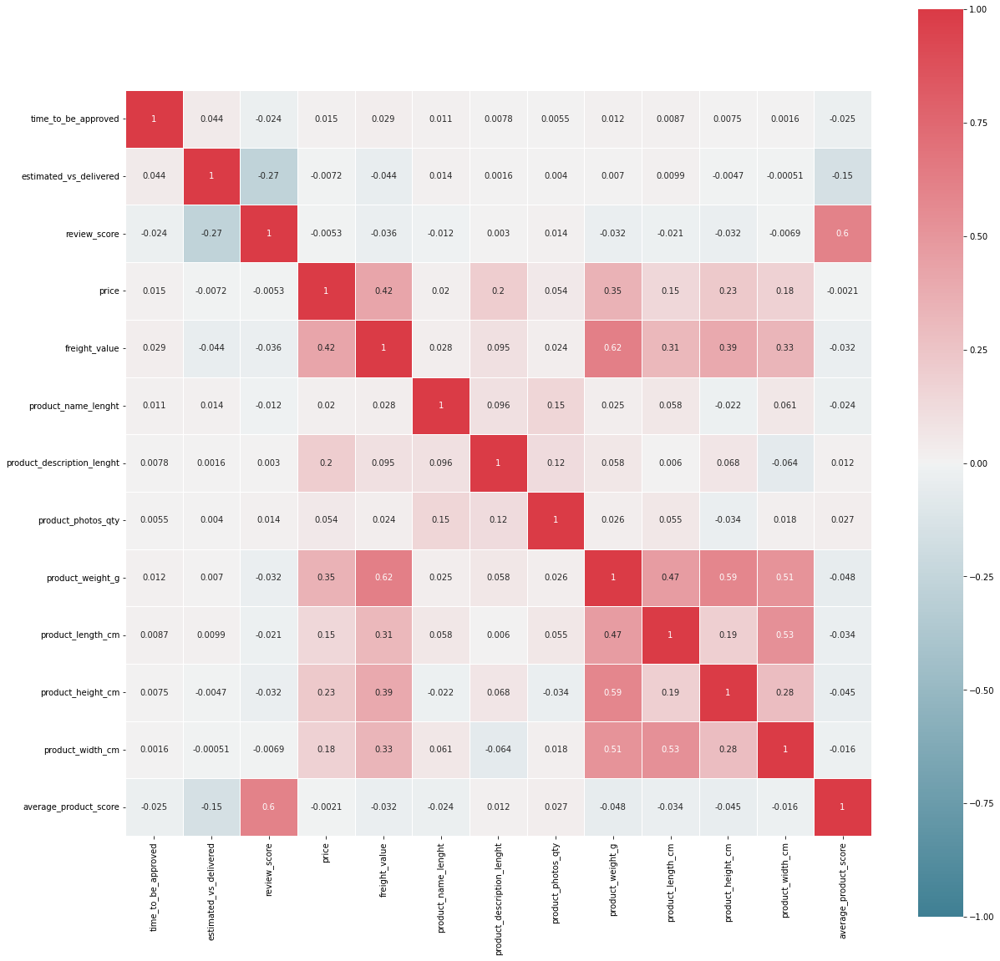

In [ ]:
# Specify the input columns you want to assemble into a vector
input_cols = (
    ds.columns[:3] + ds.columns[6:16]
)  # we decided to select columns in this way since is faster than writing each name

# Create a VectorAssembler instance
assembler = VectorAssembler(inputCols=input_cols, outputCol="features")

# Transform the Spark DataFrame using the VectorAssembler
vector_df = assembler.transform(ds).select("features")

pearsonCorr = (
    Correlation.corr(vector_df, "features", "pearson").collect()[0][0].toArray()
)

# Set the figsize
plt.figure(figsize=(20, 20))

# Plot heatmap of the correlation matrix
heatmap = sns.heatmap(
    data=pearsonCorr,
    xticklabels=input_cols,
    yticklabels=input_cols,
    annot=True,
    cmap=sns.diverging_palette(220, 10, as_cmap=True),
    vmin=-1,
    vmax=1,
    center=0,
    square=True,
    linewidths=0.5,
)

# Set the x-axis and y-axis label font size
heatmap.set_xlabel(heatmap.get_xlabel(), fontsize=16)
heatmap.set_ylabel(heatmap.get_ylabel(), fontsize=16)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [ ]:
from pyspark.ml import Pipeline
from pyspark.ml.classification import LogisticRegression, RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.feature import Normalizer, OneHotEncoder, StringIndexer, VectorAssembler
from pyspark.ml.stat import Correlation
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from sklearn.metrics import auc, roc_curve

We will explain later why we made this feature, the reason of why is here is because otherwise we will need to repeat the spliting and the ecoding again. So it dosen't make sense in the story telling, but it make sense for tecnical reason.

In [ ]:
ds = ds.withColumn(
    "score_category",
    when(col("review_score").between(1, 2), "bad")
    .when(col("review_score").between(3, 4), "good")
    .when(col("review_score") == 5, "great")
    .otherwise("unknown"),
)

display(ds)

time_to_be_approved,estimated_vs_delivered,review_score,customer_region,payment_type,more_than_one_installments,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,average_product_score,score_category
832,-9,4,Southeast,credit_card,0,9.0,8.4,40,429,1,150,25,7,16,4.12,good
3687,1,4,Southeast,credit_card,0,24.53,7.43,58,390,1,175,22,7,15,4.333333333333333,good
442,-19,5,Southeast,credit_card,1,17.9,11.85,57,646,1,300,16,30,20,4.5,great
114586,-11,4,South,boleto,0,659.8,81.93,59,1139,3,19200,34,86,40,4.666666666666667,good
1850,-22,5,Southeast,credit_card,1,38.9,18.37,56,660,8,250,25,16,20,5.0,great
50522,-15,5,Southeast,boleto,0,335.9,14.69,59,501,1,867,30,17,21,5.0,great
10647,-15,5,Northeast,credit_card,0,6.0,16.79,59,895,1,50,20,15,15,4.0,great
990,-7,5,Midwest,credit_card,1,199.9,27.7,50,941,1,1350,24,6,24,5.0,great
965,-12,5,Southeast,credit_card,1,269.99,18.14,53,748,2,6300,42,20,32,3.75,great
53358,-15,5,Southeast,boleto,0,37.9,21.43,55,3357,1,2250,16,25,11,4.5,great


We need to make vectors for the categorical features used to predict the score_category that we made, and for the score_category we need only to use string indexer because vector is not accepted as a category to be predicted.

In [ ]:
# costumer_region payment_type

indexer_region = StringIndexer(
    inputCol="customer_region", outputCol="customer_region_indexer"
)  ####### TRANSFORMER ###########
ds = indexer_region.fit(ds).transform(ds)  ####### TRANSFORMER ###########

indexer_payment = StringIndexer(
    inputCol="payment_type", outputCol="payment_type_indexer"
)  ####### TRANSFORMER ###########
ds = indexer_payment.fit(ds).transform(ds)  ####### TRANSFORMER ###########

indexer_score = StringIndexer(
    inputCol="score_category", outputCol="score_category_indexer"
)  ####### TRANSFORMER ###########
ds = indexer_score.fit(ds).transform(ds)  ####### TRANSFORMER ###########

encoder = OneHotEncoder(
    inputCols=[
        "customer_region_indexer",
        "payment_type_indexer",
    ],  ####### TRANSFORMER ###########
    outputCols=["customer_region_vec", "payment_type_vec"],
)

model = encoder.fit(ds)  ####### TRANSFORMER ###########
ds = model.transform(ds)  ####### TRANSFORMER ###########

All the values used to make freight_value are not used, since this features is influenced by them. We tested with and without them and without the model work better.
Then we removed all the metadata about the product, because if they influence the choise this influence is already captured by average_product_score.
Then time_to_be_approved and product_description_lenght have been removed because they have low coefficient in all the vectors. We tryed to remove other varibles with low coefficient but the final result get worse.

In [ ]:
input_features = [
    "estimated_vs_delivered",
    "customer_region_vec",
    "payment_type_vec",
    "more_than_one_installments",
    "freight_value",
    "average_product_score",
]

assembler = VectorAssembler(
    inputCols=input_features, outputCol="features"
)  ####### TRANSFORMER ########### (INICIALIZATION)
normalizer = Normalizer(
    inputCol="features", outputCol="normalized_features"
)  ####### TRANSFORMER ########### (INICIALIZATION)

In [ ]:
# Train-test split
train_data, test_data = ds.randomSplit([0.8, 0.2], seed=123)

In [ ]:
display(train_data)

time_to_be_approved,estimated_vs_delivered,review_score,customer_region,payment_type,more_than_one_installments,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,average_product_score,score_category,customer_region_indexer,payment_type_indexer,score_category_indexer,customer_region_vec,payment_type_vec
0,-48,4,Southeast,credit_card,1,59.9,13.0,63,715,4,1350,35,10,35,4.142857142857143,good,0.0,0.0,1.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))"
0,-40,5,Southeast,boleto,0,89.9,16.88,63,695,6,1500,25,33,25,5.0,great,0.0,1.0,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))"
0,-31,4,Southeast,credit_card,0,69.9,17.92,38,1043,2,500,17,5,13,3.8181818181818183,good,0.0,0.0,1.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))"
0,-30,5,North,credit_card,1,32.99,24.84,42,309,3,100,19,3,20,4.666666666666667,great,4.0,0.0,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))"
0,-29,5,Southeast,credit_card,1,139.97,29.17,56,1085,1,8975,35,52,36,3.6153846153846154,great,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))"
0,-28,1,Northeast,credit_card,1,636.0,30.71,47,1319,2,638,26,13,22,4.166666666666667,bad,2.0,0.0,2.0,"Map(vectorType -> sparse, length -> 4, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))"
0,-28,5,Midwest,boleto,0,1199.0,40.94,63,1985,3,5900,35,12,20,5.0,great,3.0,1.0,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))"
0,-27,1,Southeast,credit_card,1,34.99,36.75,20,262,1,8800,36,47,36,3.2,bad,0.0,0.0,2.0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))"
0,-27,4,Northeast,credit_card,1,99.9,26.44,51,1506,2,1100,24,4,24,4.0,good,2.0,0.0,1.0,"Map(vectorType -> sparse, length -> 4, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))"
0,-27,5,Northeast,credit_card,0,190.0,27.59,54,1735,1,1300,25,15,30,3.6666666666666665,great,2.0,0.0,0.0,"Map(vectorType -> sparse, length -> 4, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))"


In [ ]:
# Define the classifiers
lr = LogisticRegression(
    featuresCol="normalized_features", labelCol="review_score"
)  ####### TRANSFORMER ########### (INICIALIZATION)

# Create pipelines
lr_pipeline = Pipeline(stages=[assembler, normalizer, lr])

# Train the models
lr_model = lr_pipeline.fit(train_data)  ####### TRANSFORMER ########### (FIT)

With the true positive rate by label we can see one problem that was expected, which is that since our dataset is no balanced the prediction is always 5. So we need to balance the dataset and also to do some feature selection.

In [ ]:
# Make predictions
lr_predictions = lr_model.transform(test_data)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(
    labelCol="review_score", predictionCol="prediction"
)
metrics = ["accuracy", "f1", "weightedPrecision", "weightedRecall"]

for metric in metrics:
    value = evaluator.evaluate(lr_predictions, {evaluator.metricName: metric})
    print("Metric:", metric, " = ", value)

for label in range(1, 6):
    value = evaluator.evaluate(
        lr_predictions,
        {evaluator.metricName: "truePositiveRateByLabel", evaluator.metricLabel: label},
    )
    print("truePositiveRateByLabel for label", label, " = ", value)

Metric: accuracy  =  0.6343253159396657
Metric: f1  =  0.5238178921038421
Metric: weightedPrecision  =  0.5025947069061916
Metric: weightedRecall  =  0.6343253159396657
truePositiveRateByLabel for label 1  =  0.5781637717121588
truePositiveRateByLabel for label 2  =  0.0
truePositiveRateByLabel for label 3  =  0.0030902348578491965
truePositiveRateByLabel for label 4  =  0.014952307295694767
truePositiveRateByLabel for label 5  =  0.9710082215491129


This results are caused by the fact that the dataset is imbalanced (as you can see on the graph below), so we will try to fix this in two way. The fist one will be to merge some score togheter, so that 1 and 2 will became bad, 3 and 4 good score and 5 great score. Then if needed we can also do undersampling on the great category.

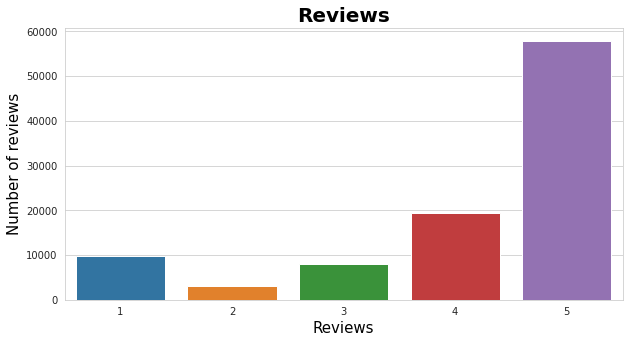

In [ ]:
# Group by review_score and count the occurrences
tempDF = ds.groupBy("review_score").count().orderBy("count", ascending=False)

# Collect the data to the driver node
tempDF_data = tempDF.collect()

# Extract the necessary columns from the collected data
review_score = [row["review_score"] for row in tempDF_data]
count = [row["count"] for row in tempDF_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(y=count[:5], x=review_score[:5])

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Reviews", color="black", fontsize=15)
plt.ylabel("Number of reviews", color="black", fontsize=15)

# Set the title with font size and style
plt.title("Reviews", color="black", fontsize=20, fontweight="bold")

# Display the plot
plt.show()

Now that we binned togheter some score the dataset is less umbalanced, but still is not balanced.

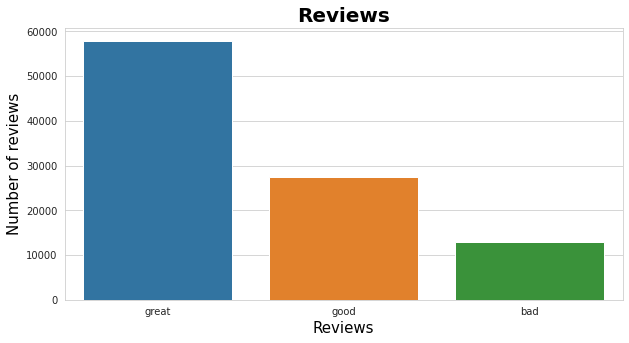

In [ ]:
# Group by score_category and count the occurrences
tempDF = ds.groupBy("score_category").count().orderBy("count", ascending=False)

# Collect the data to the driver node
tempDF_data = tempDF.collect()

# Extract the necessary columns from the collected data
score_category = [row["score_category"] for row in tempDF_data]
count = [row["count"] for row in tempDF_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(y=count[:5], x=score_category[:5])

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Reviews", color="black", fontsize=15)
plt.ylabel("Number of reviews", color="black", fontsize=15)

# Set the title with font size and style
plt.title("Reviews", color="black", fontsize=20, fontweight="bold")

# Display the plot
plt.show()

Are we do undersampling but removing randomly some observation that belong to the great category.

In [ ]:
sampled = train_data.sampleBy(
    "score_category_indexer", fractions={0: 0.5, 1: 1, 2: 1}, seed=0
)

This is the new distribution after the undersampling.

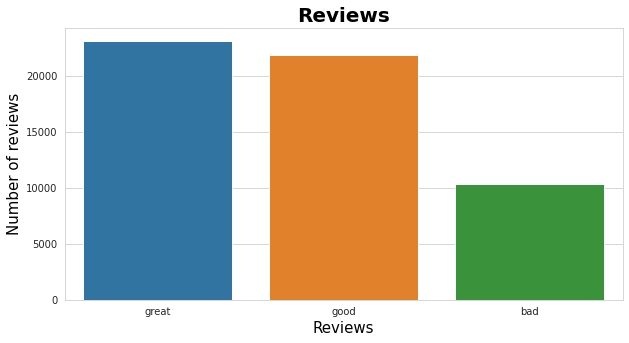

In [ ]:
# Group by score_category and count the occurrences
tempDF = sampled.groupBy("score_category").count().orderBy("count", ascending=False)

# Collect the data to the driver node
tempDF_data = tempDF.collect()

# Extract the necessary columns from the collected data
score_category = [row["score_category"] for row in tempDF_data]
count = [row["count"] for row in tempDF_data]

# Set the Seaborn style
sns.set_style("whitegrid")

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(y=count[:5], x=score_category[:5])

# Set the x-axis and y-axis labels with font sizes and styles
plt.xlabel("Reviews", color="black", fontsize=15)
plt.ylabel("Number of reviews", color="black", fontsize=15)

# Set the title with font size and style
plt.title("Reviews", color="black", fontsize=20, fontweight="bold")

# Display the plot
plt.show()

Running again the model with undersampled data.

In [ ]:
# Define the classifiers
lr = LogisticRegression(
    featuresCol="normalized_features", labelCol="score_category_indexer"
)  ####### TRANSFORMER ########### (INICIALIZATION)

# Create pipelines
lr_pipeline = Pipeline(stages=[assembler, normalizer, lr])

# Train the models
lr_model = lr_pipeline.fit(sampled)  ####### TRANSFORMER ########### (FIT)

In order to make the regression we need to transform our new category in to a vector, in this case the vector is made in descendent order by frequency. That means that great will have value 0, good value 1 and bad value 2.

In [ ]:
# Make predictions
# lr_predictions = best_lr_model.transform(test_data)
lr_predictions = lr_model.transform(test_data)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(
    labelCol="score_category_indexer", predictionCol="prediction"
)
metrics = ["accuracy", "f1", "weightedPrecision", "weightedRecall"]

for metric in metrics:
    value = evaluator.evaluate(lr_predictions, {evaluator.metricName: metric})
    print("Metric:", metric, " = ", value)

for label in range(0, 3):
    value = evaluator.evaluate(
        lr_predictions,
        {evaluator.metricName: "truePositiveRateByLabel", evaluator.metricLabel: label},
    )
    print("truePositiveRateByLabel for label", label, " = ", value)

Metric: accuracy  =  0.6281084386465552
Metric: f1  =  0.639348763369143
Metric: weightedPrecision  =  0.6676417850046765
Metric: weightedRecall  =  0.6281084386465552
truePositiveRateByLabel for label 0  =  0.683686715707486
truePositiveRateByLabel for label 1  =  0.571766418046207
truePositiveRateByLabel for label 2  =  0.4988335925349922


These are the coefficient used and transform to absolute values in order to see which is the more important.

In [ ]:
from pyspark.sql.types import FloatType, StringType, StructField, StructType

matrix = lr_model.stages[-1].coefficientMatrix.toArray()

# Define the schema of the DataFrame
schema = StructType(
    [StructField("Name", StringType(), True), StructField("Weight", FloatType(), True),]
)

for i in matrix:
    # Create an empty DataFrame with the defined schema
    tempdf = spark.createDataFrame([], schema)
    for j, f in enumerate(input_features):
        row = (f, float(i[j]))
        tempdf = tempdf.union(spark.createDataFrame([row], schema))

    tempdf = tempdf.withColumn("Weight", abs(col("Weight")))
    tempdf.sort(tempdf.Weight.desc()).show()

+--------------------+---------+
|                Name|   Weight|
+--------------------+---------+
|more_than_one_ins...|62.382786|
|       freight_value| 62.24596|
| customer_region_vec|61.644405|
|    payment_type_vec| 61.62089|
|average_product_s...|34.027622|
|estimated_vs_deli...|1.5876719|
+--------------------+---------+

+--------------------+----------+
|                Name|    Weight|
+--------------------+----------+
| customer_region_vec|  7.555803|
|    payment_type_vec|  7.377288|
|       freight_value|  7.280585|
|more_than_one_ins...|  7.208983|
|average_product_s...| 1.6371744|
|estimated_vs_deli...|0.41306403|
+--------------------+----------+

+--------------------+---------+
|                Name|   Weight|
+--------------------+---------+
|more_than_one_ins...|55.173805|
|       freight_value|54.965374|
|    payment_type_vec|54.243603|
| customer_region_vec|  54.0886|
|average_product_s...|  35.6648|
|estimated_vs_deli...| 2.000736|
+--------------------+---------

Here we left the original coefficient in order to see how they influence the result.

In [ ]:
matrix = lr_model.stages[-1].coefficientMatrix.toArray()

# Define the schema of the DataFrame
schema = StructType(
    [StructField("Name", StringType(), True), StructField("Weight", FloatType(), True),]
)

for i in matrix:
    # Create an empty DataFrame with the defined schema
    tempdf = spark.createDataFrame([], schema)
    for j, f in enumerate(input_features):
        row = (f, float(i[j]))
        tempdf = tempdf.union(spark.createDataFrame([row], schema))

    tempdf.sort(tempdf.Weight.desc()).show()

+--------------------+----------+
|                Name|    Weight|
+--------------------+----------+
|estimated_vs_deli...|-1.5876719|
|average_product_s...|-34.027622|
|    payment_type_vec| -61.62089|
| customer_region_vec|-61.644405|
|       freight_value| -62.24596|
|more_than_one_ins...|-62.382786|
+--------------------+----------+

+--------------------+-----------+
|                Name|     Weight|
+--------------------+-----------+
| customer_region_vec|   7.555803|
|    payment_type_vec|   7.377288|
|       freight_value|   7.280585|
|more_than_one_ins...|   7.208983|
|estimated_vs_deli...|-0.41306403|
|average_product_s...| -1.6371744|
+--------------------+-----------+

+--------------------+---------+
|                Name|   Weight|
+--------------------+---------+
|more_than_one_ins...|55.173805|
|       freight_value|54.965374|
|    payment_type_vec|54.243603|
| customer_region_vec|  54.0886|
|average_product_s...|  35.6648|
|estimated_vs_deli...| 2.000736|
+----------